## Spectrogram

In [6]:
import torchaudio

# 음원을 로드하는 방법(1)
file_data = torchaudio.load('ACNH.wav')
y = file_data[0] # waveform sample 
sr = file_data[1]  # sampling rate of file

# 음원을 로드하는 방법(2)
y, sr = torchaudio.load('ACNH.wav')

In [7]:
import IPython.display as ipd

# 음원을 재생하는 방법. VSC에서는 이거 안됨(video, audio output지원 X)
ipd.display(ipd.Audio(y, rate=sr))
sr # 44100Hz

48000

In [8]:
# y = 신호의 진폭값 벡터로 보면 되는 듯
y.shape

torch.Size([2, 516565])

In [9]:
# L, R체널로 나누는 것
y_left = y[0]
y_right = y[1]
ipd.display(ipd.Audio(y_left, rate=sr))
ipd.display(ipd.Audio(y_right, rate=sr))


In [10]:
# 진행할 때 체널을 둘로 나눠서 진행하지 않으므로 합치는 방향으로 나아가게 됨
ipd.Audio(y_left + y_right, rate=sr)

In [11]:
import torch
# L,R체널 합치는 방법(1)
y_mono = (y_left + y_right)/2

In [12]:
# L, R체널 합치는 방법(2) 
y_mono = y.mean(dim=0)

y_mono.shape

torch.Size([516565])

In [13]:
ipd.Audio(y_mono, rate= sr)

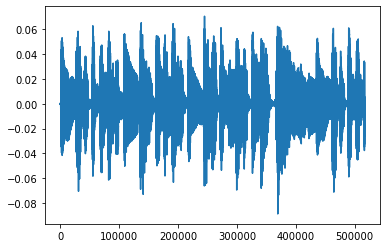

In [14]:
import matplotlib.pyplot as plt

# 신호 진폭값
plt.plot(y_mono)

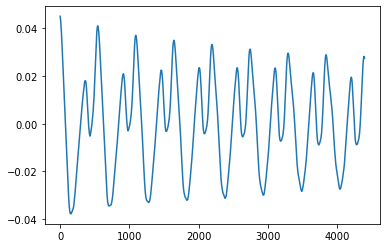

In [15]:
plt.plot(y_mono[4400:8800])

In [16]:
# torchaudio에서 spectrogram 만드는 법

# functional
spec = torchaudio.functional.spectrogram(y_mono, n_fft=2048, 
                                         hop_length=1024, 
                                         pad=0, 
                                         win_length=2048,
                                         power=True,
                                         normalized=True,
                                         window = torch.hann_window(2048)
                                        )

# Class로 만드는 법을 조금 더 추천드립니다...
spec_converter = torchaudio.transforms.Spectrogram(n_fft=2048,
                                                  )
spec = spec_converter(y_mono)

In [17]:
# y_clip: [5초:10초]
y_clip = y_mono[5*sr:10*sr]
ipd.Audio(y_clip, rate=sr)



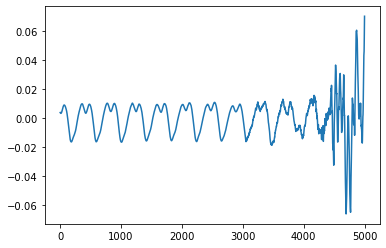

In [18]:
plt.plot(y_clip[:5000])

In [19]:
def rect_window(win_size):
  return torch.ones(win_size)


single_spec_converter = torchaudio.transforms.Spectrogram(n_fft=2048,
                                                          hop_length=2048,
                                                          center=False,
                                                          window_fn=rect_window
                                                        )

torch.Size([1025, 1])

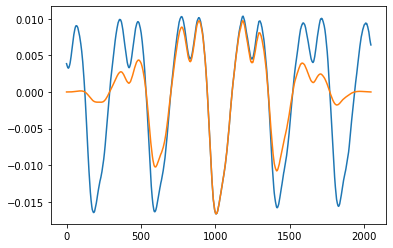

In [20]:
n_fft = 2048
window_tensor = torch.hann_window(2048)
sample_slice = y_clip[0:n_fft]
windowed_slice = sample_slice * window_tensor

plt.plot(sample_slice)
plt.plot(windowed_slice)

fft_result = single_spec_converter(windowed_slice)
fft_result.shape

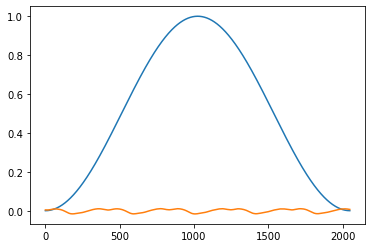

In [21]:
window_tensor = torch.hann_window(2048)
window_tensor
plt.plot(window_tensor)
plt.plot(sample_slice)

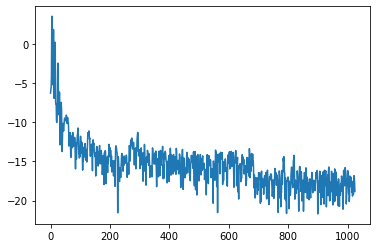

In [22]:
plt.plot(torch.log(fft_result))

In [23]:
# center==True:
'''
center==True일때

0번째 hop window의 중심 샘플 =  0*hop_length
1번째 hop window의 중심 샘플 = 1*hop_length

center==False

0번째 hop window의 첫 샘플 = 0 * hop_length

'''

'\ncenter==True일때\n\n0번째 hop window의 중심 샘플 =  0*hop_length\n1번째 hop window의 중심 샘플 = 1*hop_length\n\ncenter==False\n\n0번째 hop window의 첫 샘플 = 0 * hop_length\n\n'

In [24]:
n_fft = 2048 // 4
window_tensor = torch.hann_window(n_fft)
hop_length = 512 // 4

single_spec_converter = torchaudio.transforms.Spectrogram(n_fft=n_fft,
                                                          hop_length=n_fft,
                                                         center=False,
                                                          window_fn=rect_window
                                                    )

total_result = []
for hop_start in range(0, len(y_clip)-n_fft, hop_length):
  sample_slice = y_clip[hop_start:hop_start+n_fft]
  windowed_slice = sample_slice * window_tensor

  fft_result = single_spec_converter(windowed_slice) # windowed_slice에 FFT 연산 실행
  total_result.append(fft_result)

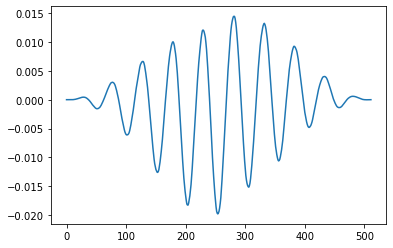

In [25]:
plt.plot(windowed_slice)

In [26]:
ipd.Audio(windowed_slice, rate=sr)

In [27]:
total_result[0].shape

torch.Size([257, 1])

In [28]:
total_spec = torch.cat(total_result, dim=1)
total_spec.shape

torch.Size([257, 1871])

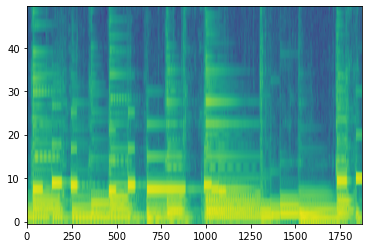

In [29]:
plt.imshow(torch.log(total_spec[:50]), origin='lower', aspect='auto')

In [30]:
ipd.Audio(y_clip, rate=sr)

In [31]:
spec.shape

torch.Size([1025, 505])

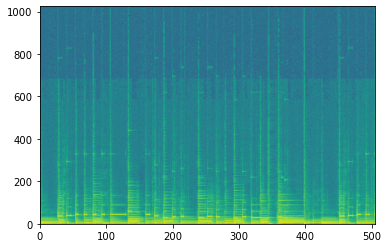

In [32]:
plt.imshow(torch.log(spec), aspect='auto', origin='lower')

## Mel Scale

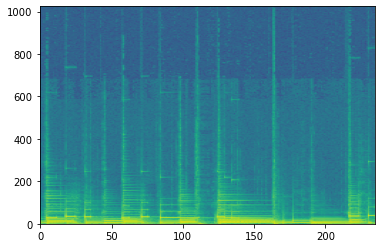

In [33]:
spec_converter = torchaudio.transforms.Spectrogram(n_fft=2048,
                                                  )
spec = spec_converter(y_clip)
plt.imshow(torch.log(spec), aspect='auto', origin='lower')

In [34]:
mel_scale = torchaudio.transforms.MelScale(n_mels=80, 
                                           sample_rate=44100, 
                                           f_min=20, 
                                           f_max=8000, 
                                           n_stft=spec.shape[0])


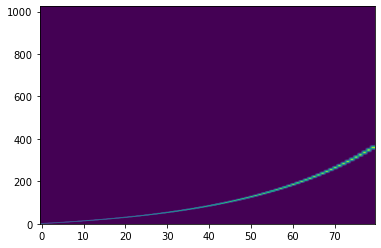

In [35]:
plt.imshow(mel_scale.fb, aspect='auto', origin='lower')

tensor([0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.2421, 0.7579,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000])

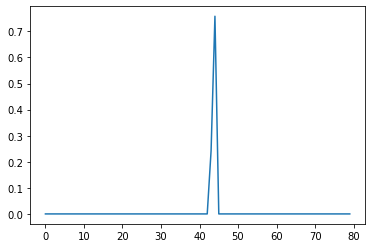

In [36]:
plt.plot(mel_scale.fb[100])
mel_scale.fb[100]

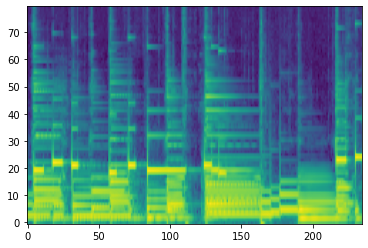

In [37]:
mel_spec = mel_scale(spec)
plt.imshow(torch.log(mel_spec), origin='lower', aspect='auto')

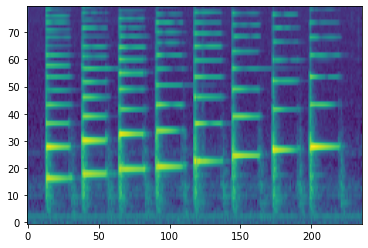

In [38]:
y, sr = torchaudio.load("piano_scale.wav")
y_clip = y[0]

spec = spec_converter(y_clip)
mel_spec = mel_scale(spec)
plt.imshow(torch.log(mel_spec), aspect='auto', origin='lower')

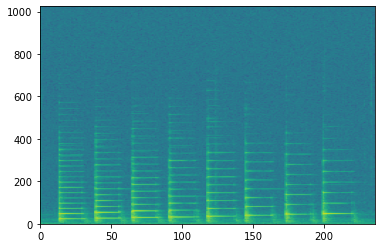

In [39]:
plt.imshow(torch.log(spec), aspect='auto', origin='lower')

### Mel Spectrogram

## Neural Network with simple toy example

In [40]:
from math import pi 
def make_sine_wave(pitch, amplitude, duration, sampling_rate):
  return torch.sin(torch.arange(sampling_rate*duration)/sampling_rate * pitch * 2 * pi) * amplitude

pitch_list = list(range(400, 1500, 100))
pitch_list

[400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400]

In [41]:
import torch
import random
# 길이 2초, Sample Rate: 16000Hz
duration = 2
SR = 16000

# 데이터를 만들었습니다
total_data = []
for pitch in pitch_list:
  pitch_wave = []
  for i in range(100):
    amplitude = random.random() ** 3
    sine_wave = make_sine_wave(pitch, amplitude, duration, SR)
    white_noise = torch.rand(SR*duration) * 2 -1
    sine_wave += white_noise * random.random() ** 2
    pitch_wave.append(sine_wave)
  pitch_wave = torch.stack(pitch_wave)
  print(pitch_wave.shape)
  total_data.append(pitch_wave)
#   ipd.display(ipd.Audio(sine_wave, rate=SR))

torch.Size([100, 32000])
torch.Size([100, 32000])
torch.Size([100, 32000])
torch.Size([100, 32000])
torch.Size([100, 32000])
torch.Size([100, 32000])
torch.Size([100, 32000])
torch.Size([100, 32000])
torch.Size([100, 32000])
torch.Size([100, 32000])
torch.Size([100, 32000])


In [42]:
total_tensor = torch.stack(total_data)
total_tensor.shape

torch.Size([11, 100, 32000])

In [43]:
import torchaudio
spec_converter = torchaudio.transforms.Spectrogram(n_fft=1024)

total_spec = spec_converter(total_tensor)

In [44]:
total_spec.shape

torch.Size([11, 100, 513, 63])

In [45]:
# 4번째 pitch의 17번째 (100개 중) 사인 오디오 샘플의 스펙트로그램
total_spec[4, 17]

tensor([[801.5082, 245.8135,  78.6732,  ...,  10.4758, 239.6524,  42.3187],
        [315.3203,  84.6021,  84.4275,  ..., 144.7532,  41.7337,  45.8229],
        [  2.9407, 183.8360, 191.4883,  ...,  57.6637,  33.5740,  64.1519],
        ...,
        [119.6407,   2.7188, 104.7900,  ...,  32.0902, 185.9981,  17.6414],
        [180.6504,   2.6170,  77.2231,  ...,  79.8516, 263.3814,  16.9130],
        [215.2631,   5.6143,  59.7172,  ...,  78.6760, 178.8713,  52.1318]])

In [46]:
total_spec[:, 24, :,43]



tensor([[3.9544e+00, 7.4092e+00, 8.9925e+00,  ..., 1.1895e+01, 1.9296e+00,
         8.0806e+00],
        [5.7006e-04, 2.1384e-02, 8.6547e-02,  ..., 2.2789e-01, 7.7814e-02,
         2.1107e-01],
        [1.0246e-01, 8.2428e-02, 5.1841e-03,  ..., 1.4232e-02, 3.7862e-02,
         1.6393e-03],
        ...,
        [1.4897e+01, 4.2772e+01, 5.5965e+01,  ..., 1.8381e+01, 6.4916e+00,
         8.3465e+00],
        [1.8178e+01, 7.5665e+00, 8.7808e+00,  ..., 3.5919e+01, 4.9070e+01,
         4.6151e+01],
        [2.2010e+00, 9.7503e-01, 2.7729e-01,  ..., 7.9458e-02, 1.1958e-01,
         4.8322e-01]])

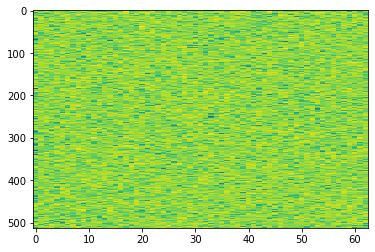

In [47]:
import matplotlib.pyplot as plt
plt.imshow(torch.log(total_spec[10, 70]), aspect='auto', interpolation='nearest')

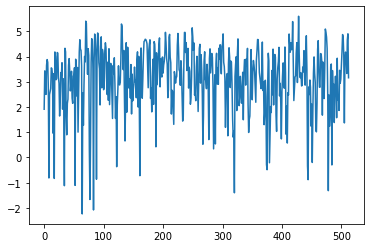

In [48]:
plt.plot(torch.log(total_spec[10, 70, :, 30])) # 10번째 pitch 샘플의 70번째 사인 오디오 샘플의 전체 프리퀀시 bin, 30번째 time bin

In [49]:
import torch.nn as nn
model = torch.randn(513, 11, requires_grad=True) / 513
# model = nn.Linear
model

tensor([[-3.8258e-04,  7.4316e-04, -2.4739e-03,  ..., -3.1802e-03,
         -1.5446e-03,  1.8535e-03],
        [-4.5916e-03,  1.7475e-03,  1.6415e-03,  ..., -3.2346e-03,
         -1.0615e-04,  1.6604e-03],
        [-2.5171e-03, -3.7738e-05,  5.9335e-04,  ..., -7.7019e-05,
          2.3556e-03,  1.8426e-03],
        ...,
        [ 4.3623e-03, -1.0012e-03, -1.4526e-03,  ..., -3.2422e-03,
         -9.2779e-04, -1.0698e-03],
        [-1.0887e-03, -3.4125e-04, -8.3863e-04,  ..., -7.8275e-04,
          1.7262e-04,  6.1070e-04],
        [ 1.0857e-03, -3.9435e-03,  2.5701e-03,  ..., -1.9520e-04,
         -2.2067e-03, -2.2201e-03]], grad_fn=<DivBackward0>)

In [50]:
model[0, 5] # 0번째 frequency bin에 대한 5번째 뉴런의 weight

tensor(-0.0020, grad_fn=<SelectBackward0>)

In [51]:
log_spec = torch.log(total_spec + 1e-6)

In [52]:
log_spec.shape

torch.Size([11, 100, 513, 63])

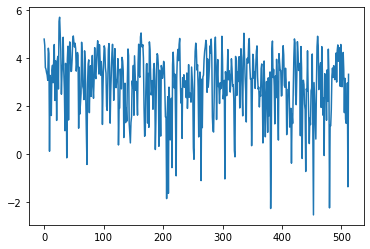

In [53]:
'''
0번째 pitch의 5번째 sine sample의 전체 frequency bin, 30번째 time bin
'''
input_tensor = log_spec[0, 5, :, 30]
plt.plot(input_tensor)

In [54]:
input_tensor.shape, model.shape

(torch.Size([513]), torch.Size([513, 11]))

In [55]:
output = torch.matmul(input_tensor, model)
output

tensor([ 0.1886, -0.2845, -0.0520,  0.0127, -0.0657, -0.1543, -0.0252, -0.0221,
        -0.1871,  0.0402,  0.1484], grad_fn=<SqueezeBackward3>)

In [56]:
torch.softmax(output, dim=0)

tensor([0.1129, 0.0703, 0.0887, 0.0947, 0.0875, 0.0801, 0.0911, 0.0914, 0.0775,
        0.0973, 0.1084], grad_fn=<SoftmaxBackward0>)

In [57]:
# def softmax(atensor, dim):

exponential_value = torch.exp(output)
exponential_value

tensor([1.2076, 0.7524, 0.9493, 1.0128, 0.9364, 0.8570, 0.9751, 0.9781, 0.8294,
        1.0410, 1.1600], grad_fn=<ExpBackward0>)

In [58]:
exponential_value.sum()

tensor(10.6991, grad_fn=<SumBackward0>)

In [59]:
# softmax result
exponential_value / exponential_value.sum()

tensor([0.1129, 0.0703, 0.0887, 0.0947, 0.0875, 0.0801, 0.0911, 0.0914, 0.0775,
        0.0973, 0.1084], grad_fn=<DivBackward0>)

In [60]:
softmax_result = torch.softmax(output, dim=0)
softmax_result 

tensor([0.1129, 0.0703, 0.0887, 0.0947, 0.0875, 0.0801, 0.0911, 0.0914, 0.0775,
        0.0973, 0.1084], grad_fn=<SoftmaxBackward0>)

In [61]:
target_class_prob = softmax_result[0]
target_class_prob  # 1에 가까워져야함

tensor(0.1129, grad_fn=<SelectBackward0>)

In [62]:
loss = -torch.log(target_class_prob+1e-6)
loss

tensor(2.1815, grad_fn=<NegBackward0>)

In [63]:
loss.backward()

In [64]:
model = nn.Linear(513, 11)

def run_model(model, input_tensor, label_idx):
  output = torch.matmul(input_tensor, model.weight.T)
  softmax_result = torch.softmax(output, dim=0)
  loss = -torch.log(softmax_result[label_idx]+1e-6)
  return loss

def update_parameters(model, lr=0.001):
  model.weight.data -= model.weight.grad * lr # update model parameter
  model.weight.grad = None
  

# loss = run_model(model, input_tensor, 0)
# loss.backward()
# update_parameters(model)

In [65]:
loss = run_model(model, input_tensor, 0)
print(loss)
loss.backward()
update_parameters(model)
loss = run_model(model, input_tensor, 0)
print(loss)

tensor(4.5077, grad_fn=<NegBackward0>)
tensor(0.0920, grad_fn=<NegBackward0>)


In [66]:
torch.set_printoptions(sci_mode=False)
torch.softmax(model(input_tensor), dim=0)

tensor([    0.9101,     0.0003,     0.0112,     0.0012,     0.0093,     0.0009,
            0.0087,     0.0008,     0.0023,     0.0282,     0.0270],
       grad_fn=<SoftmaxBackward0>)

In [67]:
def get_input_tensor(pitch):
  sample_idx = random.randint(0, 99)
  input_tensor = log_spec[pitch, sample_idx, :, 30]
  return input_tensor

pitch_id = 5
input_tensor = get_input_tensor(pitch_id)
run_model(model, input_tensor, pitch_id)

tensor(1.5001, grad_fn=<NegBackward0>)

In [68]:
loss_record = []
model = nn.Linear(513, 11)
for i in range(5000):
  for pitch in range(11):
    input_tensor = get_input_tensor(pitch)
    loss = run_model(model, input_tensor, pitch)
    loss.backward()
    update_parameters(model, lr=1e-4)
    loss_record.append(loss.item())

In [69]:
loss

tensor(0.1258, grad_fn=<NegBackward0>)

In [70]:
'''
What is nn.Linear()
'''
# torch.manual_seed(0)
sample_linear = nn.Linear(12, 5)
sample_linear.weight, sample_linear.bias

sample_input = torch.arange(12).float()

output_a = sample_linear(sample_input)
output_b = torch.matmul(sample_input, sample_linear.weight.T)

output_a, output_b, sample_linear.bias

(tensor([-5.1788,  8.0878, -2.1887, -2.6501,  2.2754], grad_fn=<AddBackward0>),
 tensor([-5.3151,  7.8883, -2.2602, -2.7557,  2.0148],
        grad_fn=<SqueezeBackward3>),
 Parameter containing:
 tensor([0.1363, 0.1995, 0.0716, 0.1056, 0.2606], requires_grad=True))

In [71]:
sample_linear.bias

Parameter containing:
tensor([0.1363, 0.1995, 0.0716, 0.1056, 0.2606], requires_grad=True)

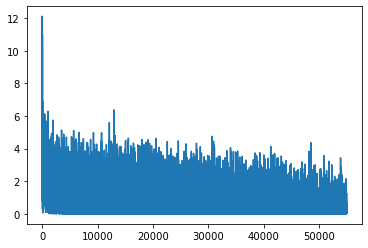

In [72]:
plt.plot(loss_record)

In [73]:
model.weight, model.bias

(Parameter containing:
 tensor([[ 0.0469, -0.0881,  0.0122,  ..., -0.0407,  0.0015, -0.0391],
         [-0.0407,  0.0134, -0.0268,  ...,  0.0003,  0.0436,  0.0005],
         [ 0.0266,  0.0197,  0.0553,  ..., -0.0151,  0.0265, -0.0046],
         ...,
         [-0.0138,  0.0197, -0.0054,  ...,  0.0140,  0.0519, -0.0265],
         [-0.0280,  0.0650, -0.0093,  ...,  0.0058, -0.0027, -0.0708],
         [-0.0715, -0.0122, -0.0084,  ..., -0.0062,  0.0515, -0.0262]],
        requires_grad=True),
 Parameter containing:
 tensor([-0.0164,  0.0158,  0.0041, -0.0369, -0.0134, -0.0132, -0.0269, -0.0130,
         -0.0055, -0.0077, -0.0191], requires_grad=True))

In [74]:
model.weight.shape

torch.Size([11, 513])

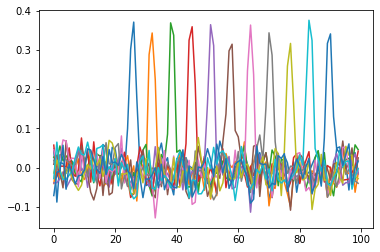

In [75]:
# Weight visualization
for i in range(11):
  plt.plot(model.weight[i,:100].detach())

In [76]:
log_spec.shape

torch.Size([11, 100, 513, 63])

In [77]:
torch.log(torch.zeros(1)+1e-7)

tensor([-16.1181])

In [78]:
model.weight.shape, model.weight.grad.shape

AttributeError: 'NoneType' object has no attribute 'shape'

In [ ]:
model.weight.grad

In [79]:
full_converter = torchaudio.transforms.Spectrogram(onesided=False)
spec = full_converter(y_clip)

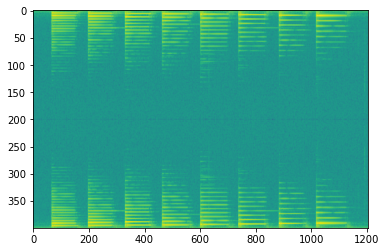

In [80]:
plt.imshow(torch.log(spec), aspect='auto')

In [81]:
1e-7

1e-07

In [82]:
pitch_list

[400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400]

In [83]:
white_noise = torch.rand(SR*duration) * 2 -1
ipd.Audio(white_noise, rate=SR)

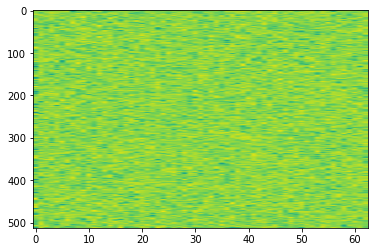

In [84]:
plt.imshow(spec_converter(white_noise).log(), aspect='auto')

In [85]:
sine_wave

tensor([ 0.1334,  0.3872,  0.9848,  ..., -1.0611, -0.6730, -0.6405])